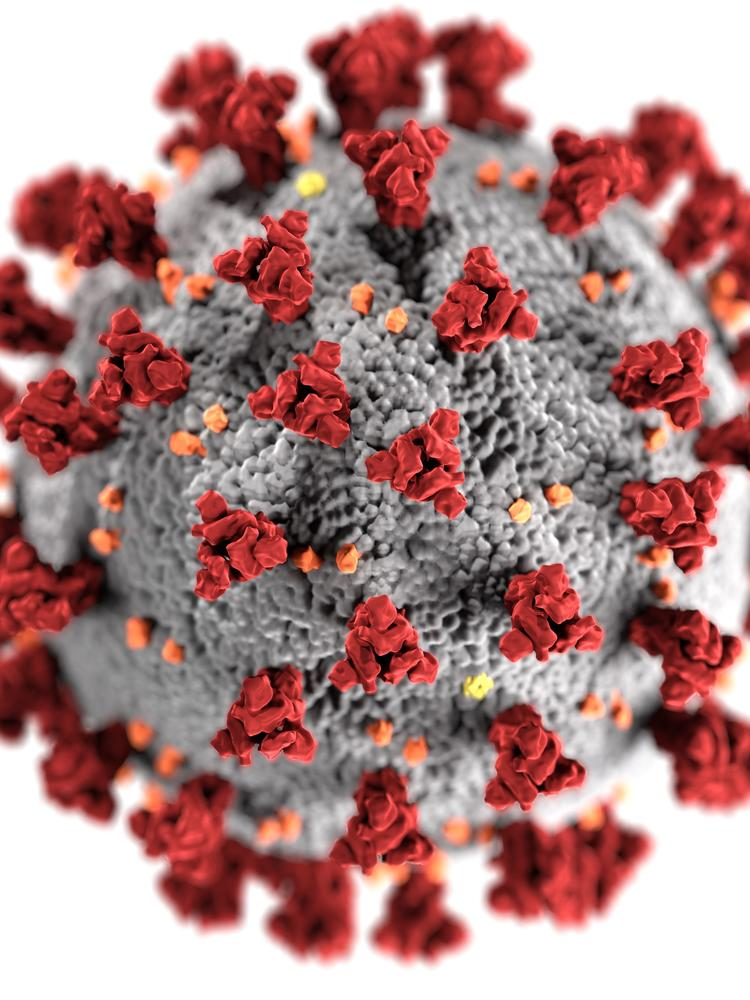

# AMAÇ 

## Sınıflandırma:
    İlk olarak Data Visualization daha sonra 
    Veri setinizdeki "Confirmed" ve "Recovered" gibi değişkenlerin değerlerine dayanarak, hastaların durumunu  
    (iyileşmiş, aktif, ölmüş) tahmin etmek için sınıflandırma modelleri kullanılacak
    

Örneğin, Lojistik Regresyon, Destek Vektör Makineleri veya Karar Ağaçları gibi sınıflandırma algoritmaları kullanılabilir.

import pandas as pd      
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

from scipy.stats import skew

import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
pio.templates.default = "plotly_dark"
from plotly.subplots import make_subplots

from sklearn.model_selection import cross_validate
import warnings
warnings.filterwarnings('ignore')
plt.rcParams["figure.figsize"] = (7,4)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', '{:.0f}'.format)

In [1]:
#pip install tensorflow

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
from plotly.subplots import make_subplots
import os
import random
import PIL
import tensorflow as tf
from tensorflow.keras.layers import Activation, Dense, Flatten, Input, Conv2D, MaxPooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications.resnet import ResNet152, preprocess_input, decode_predictions, ResNet50
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img, array_to_img
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder
from scipy.stats import skew
import warnings

# Configure plotly template
pio.templates.default = "plotly_dark"

# Set seaborn style
sns.set_style("whitegrid")

# Filter warnings
warnings.filterwarnings('ignore')

# Set plot size
plt.rcParams["figure.figsize"] = (7,4)

# Set pandas display options
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', '{:.0f}'.format)


# EDA | | Data Visualization

## covid_19_clean_complete.csv

In [3]:
cleaned_data = pd.read_csv('covid_19_clean_complete.csv')
cleaned_data.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
0,NaN,Afghanistan,34,68,2020-01-22,0,0,0,0,Eastern Mediterranean
1,NaN,Albania,41,20,2020-01-22,0,0,0,0,Europe
2,NaN,Algeria,28,2,2020-01-22,0,0,0,0,Africa
3,NaN,Andorra,43,2,2020-01-22,0,0,0,0,Europe
4,NaN,Angola,-11,18,2020-01-22,0,0,0,0,Africa


In [4]:
cleaned_data.rename(columns={'ObservationDate': 'date', 
                     'Province/State':'state',
                     'Country/Region':'country',
                     'Last Update':'last_updated',
                     'Confirmed': 'confirmed',
                     'Deaths':'deaths',
                     'Recovered':'recovered'
                    }, inplace=True)

# cases AAAA
cases = ['confirmed', 'deaths', 'recovered', 'active']

# Active Case = confirmed - deaths - recovered
cleaned_data['active'] = cleaned_data['confirmed'] - cleaned_data['deaths'] - cleaned_data['recovered']

# replacing Mainland china with just China
cleaned_data['country'] = cleaned_data['country'].replace('Mainland China', 'China')

# filling missing values 
cleaned_data[['state']] = cleaned_data[['state']].fillna('')
cleaned_data[cases] = cleaned_data[cases].fillna(0)
cleaned_data.rename(columns={'Date':'date'}, inplace=True)

In [5]:

# 'date' sütununu tarih tipine dönüştürme
cleaned_data['date'] = pd.to_datetime(cleaned_data['date'])

# Tarih aralığını yazdırma
print("External cleaned_data")
print(f"Earliest Entry: {cleaned_data['date'].min()}")
print(f"Last Entry:     {cleaned_data['date'].max()}")
print(f"Total Days:     {(cleaned_data['date'].max() - cleaned_data['date'].min()).days}")


External cleaned_data
Earliest Entry: 2020-01-22 00:00:00
Last Entry:     2020-07-27 00:00:00
Total Days:     187


state: Verinin bulunduğu durum veya eyalet.

country: Verinin ait olduğu ülke.

Lat: Enlem bilgisi.

Long: Boylam bilgisi.

date: Tarih bilgisi.

confirmed: Onaylanmış (veya doğrulanmış) vaka sayısı.

deaths: Ölüm sayısı.

recovered: İyileşen kişi sayısı.

Active: Aktif vaka sayısı.

WHO Region: Dünya Sağlık Örgütü (WHO) tarafından belirlenen bölge.

active: Aktif durum (genellikle aktif vaka sayısını ifade eder).

In [6]:
new_sutunlar = {
    'state': 'Durum',
    'country': 'Ülke',
    'Lat': 'Enlem',
    'Long': 'Boylam',
    'date': 'Tarih',
    'confirmed': 'Onaylanmış',
    'deaths': 'Ölümler',
    'recovered': 'İyileşenler',
    'Active': 'Aktif',
    'WHO Region': 'WHO Bölgesi',
    'active': 'Aktif Durum'
}

cleaned_data.rename(columns=new_sutunlar, inplace=True)


In [7]:
cleaned_data.sample(1)

,Durum,Ülke,Enlem,Boylam,Tarih,Onaylanmış,Ölümler,İyileşenler,Aktif,WHO Bölgesi,Aktif Durum
46174,,Guinea-Bissau,12,-15,2020-07-16,1902,26,773,1103,Africa,1103


In [8]:
cleaned_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Durum        49068 non-null  object        
 1   Ülke         49068 non-null  object        
 2   Enlem        49068 non-null  float64       
 3   Boylam       49068 non-null  float64       
 4   Tarih        49068 non-null  datetime64[ns]
 5   Onaylanmış   49068 non-null  int64         
 6   Ölümler      49068 non-null  int64         
 7   İyileşenler  49068 non-null  int64         
 8   Aktif        49068 non-null  int64         
 9   WHO Bölgesi  49068 non-null  object        
 10  Aktif Durum  49068 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(5), object(3)
memory usage: 4.1+ MB


In [9]:
cleaned_data.isnull().sum()

Durum          0
Ülke           0
Enlem          0
Boylam         0
Tarih          0
Onaylanmış     0
Ölümler        0
İyileşenler    0
Aktif          0
WHO Bölgesi    0
Aktif Durum    0
dtype: int64

In [10]:
cleaned_data.describe().T

,count,mean,min,25%,50%,75%,max,std
Enlem,49068,21,-52,8,24,41,72,25
Boylam,49068,24,-135,-15,22,81,178,70
Tarih,49068,2020-04-24 12:00:00,2020-01-22 00:00:00,2020-03-08 18:00:00,2020-04-24 12:00:00,2020-06-10 06:00:00,2020-07-27 00:00:00,NaN
Onaylanmış,49068,16885,0,4,168,1518,4290259,127300
Ölümler,49068,884,0,0,2,30,148011,6314
İyileşenler,49068,7916,0,0,29,666,1846641,54801
Aktif,49068,8085,-14,0,26,606,2816444,76259
Aktif Durum,49068,8085,-14,0,26,606,2816444,76259


In [11]:
# Veri setinin genel bir profilini elde etmek için
# Gözlem sayısı-veri tipi-null değer sayısı-unique değer sayısı-min-max değerleri
# null değerler "0" gözüküyor!

def summary(data, pred=None):
    obs = data.shape[0]
    Types = data.dtypes
    Counts = data.apply(lambda x: x.count())
    Min = data.min()
    Max = data.max()
    Uniques = data.apply(lambda x: x.unique().shape[0])
    Nulls = data.apply(lambda x: x.isnull().sum())
    print('Data shape:', data.shape)
    print('-------------------')
    nul = data.isnull().sum()
    if (nul == 0).all():
        print("Nul değerler 0'dır")
    else:
        for column, count in nul.items():
            if count != 0:
                print(f"{column} sayısı : {count}")

    if pred is None:
        cols = ['Types', 'Counts', 'Uniques', 'Nulls', 'Min', 'Max']
        str = pd.concat([Types, Counts, Uniques, Nulls, Min, Max], axis = 1, sort=True)

    str.columns = cols
    print('___________________________\nData Types:')
    print(str.Types.value_counts())
    print('___________________________')
    return str

summary(cleaned_data)

Data shape: (49068, 11)
-------------------
Nul değerler 0'dır
___________________________
Data Types:
Types
int64             5
object            3
float64           2
datetime64[ns]    1
Name: count, dtype: int64
___________________________


,Types,Counts,Uniques,Nulls,Min,Max
Aktif,int64,49068,8641,0,-14,2816444
Aktif Durum,int64,49068,8641,0,-14,2816444
Boylam,float64,49068,261,0,-135,178
Durum,object,49068,79,0,,Zhejiang
Enlem,float64,49068,260,0,-52,72
Onaylanmış,int64,49068,10861,0,0,4290259
Tarih,datetime64[ns],49068,188,0,2020-01-22 00:00:00,2020-07-27 00:00:00
WHO Bölgesi,object,49068,6,0,Africa,Western Pacific
Ölümler,int64,49068,3640,0,0,148011
Ülke,object,49068,187,0,Afghanistan,Zimbabwe


## country_wise_latest.csv

In [12]:
country_wise_latest = pd.read_csv("country_wise_latest.csv")
data = country_wise_latest.copy()
data.head(5)

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,4,69,5,35526,737,2,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,3,56,5,4171,709,17,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4,67,6,23691,4282,18,Africa
3,Andorra,907,52,803,52,10,0,0,6,89,6,884,23,3,Europe
4,Angola,950,41,242,667,18,1,0,4,25,17,749,201,27,Africa


Country/Region: Veri kaydının ilişkilendiği ülke veya bölge.

Confirmed: Ülkedeki toplam doğrulanmış COVID-19 vakalarının sayısı.

Deaths: Ülkedeki toplam COVID-19 ölümlerinin sayısı.

Recovered: Ülkedeki toplam iyileşen COVID-19 vakalarının sayısı.

Active: Ülkedeki aktif COVID-19 vakalarının sayısı (şu anda enfekte olanlar).

New cases: Günlük olarak rapor edilen yeni COVID-19 vakalarının sayısı.

New deaths: Günlük olarak rapor edilen yeni COVID-19 ölümlerinin sayısı.

New recovered: Günlük olarak rapor edilen yeni iyileşen COVID-19 vakalarının sayısı.

Deaths / 100 Cases: Toplam ölüm sayısının doğrulanmış vakaların yüzde olarak oranı.

Recovered / 100 Cases: Toplam iyileşen sayısının doğrulanmış vakaların yüzde olarak oranı.

Deaths / 100 Recovered: Toplam ölüm sayısının toplam iyileşen sayının yüzde olarak oranı.

Confirmed last week: Bir hafta önce doğrulanmış COVID-19 vakalarının toplam sayısı.

1 week change: Bir hafta içindeki toplam doğrulanmış vaka sayısındaki değişim.

1 week % increase: Bir haftalık artışın yüzde olarak oranı.

WHO Region: Veri kaydının ait olduğu Dünya Sağlık Örgütü (WHO) bölgesi.

In [13]:
new_sutunlar = {
    "Country/Region": "Ülke",
    "Confirmed": "Onaylanan",
    "Deaths": "Ölümler",
    "Recovered": "İyileşen",
    "Active": "Aktif",
    "New cases": "Yeni Vakalar",
    "New deaths": "Yeni Ölümler",
    "New recovered": "Yeni İyileşenler",
    "Deaths / 100 Cases": "Ölüm (100 Vaka)",
    "Recovered / 100 Cases": "İyileşen (100 Vaka)",
    "Deaths / 100 Recovered": "Ölüm (100 İyileşen)",
    "Confirmed last week": "Geçen Hafta Onaylanan",
    "1 week change": "Haftalık Değişim",
    "1 week % increase": "Haftalık Yüzdelik Artış",
    "WHO Region": "Dünya Sağlık Örgütü Bölgesi"
}

# Sütun isimlerini değiştir
data.rename(columns=new_sutunlar, inplace=True)

In [14]:
data.sample(1)

,Ülke,Onaylanan,Ölümler,İyileşen,Aktif,Yeni Vakalar,Yeni Ölümler,Yeni İyileşenler,Ölüm (100 Vaka),İyileşen (100 Vaka),Ölüm (100 İyileşen),Geçen Hafta Onaylanan,Haftalık Değişim,Haftalık Yüzdelik Artış,Dünya Sağlık Örgütü Bölgesi
51,Ecuador,81161,5532,34896,40733,467,17,0,7,43,16,74620,6541,9,Americas


In [15]:
# Veri setinin genel bir profilini elde etmek için
# Gözlem sayısı-veri tipi-null değer sayısı-unique değer sayısı-min-max değerleri
# null değerler "0" gözüküyor!

def summary(data, pred=None):
    obs = data.shape[0]
    Types = data.dtypes
    Counts = data.apply(lambda x: x.count())
    Min = data.min()
    Max = data.max()
    Uniques = data.apply(lambda x: x.unique().shape[0])
    Nulls = data.apply(lambda x: x.isnull().sum())
    print('Data shape:', data.shape)
    print('-------------------')
    nul = data.isnull().sum()
    if (nul == 0).all():
        print("Nul değerler 0'dır")
    else:
        for column, count in nul.items():
            if count != 0:
                print(f"{column} sayısı : {count}")

    if pred is None:
        cols = ['Types', 'Counts', 'Uniques', 'Nulls', 'Min', 'Max']
        str = pd.concat([Types, Counts, Uniques, Nulls, Min, Max], axis = 1, sort=True)

    str.columns = cols
    print('___________________________\nData Types:')
    print(str.Types.value_counts())
    print('___________________________')
    return str

summary(data)

Data shape: (187, 15)
-------------------
Nul değerler 0'dır
___________________________
Data Types:
Types
int64      9
float64    4
object     2
Name: count, dtype: int64
___________________________


,Types,Counts,Uniques,Nulls,Min,Max
Aktif,int64,187,173,0,0,2816444
Dünya Sağlık Örgütü Bölgesi,object,187,6,0,Africa,Western Pacific
Geçen Hafta Onaylanan,int64,187,183,0,10,3834677
Haftalık Değişim,int64,187,162,0,-47,455582
Haftalık Yüzdelik Artış,float64,187,169,0,-4,226
Onaylanan,int64,187,184,0,10,4290259
Yeni Vakalar,int64,187,122,0,0,56336
Yeni Ölümler,int64,187,38,0,0,1076
Yeni İyileşenler,int64,187,103,0,0,33728
Ölüm (100 Vaka),float64,187,145,0,0,29


In [16]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Onaylanan,187,88131,383319,10,1114,5059,40460,4290259
Ölümler,187,3498,14100,0,18,108,734,148011
İyileşen,187,50631,190188,0,626,2815,22606,1846641
Aktif,187,34002,213326,0,142,1600,9149,2816444
Yeni Vakalar,187,1223,5710,0,4,49,420,56336
Yeni Ölümler,187,29,120,0,0,1,6,1076
Yeni İyileşenler,187,934,4198,0,0,22,221,33728
Ölüm (100 Vaka),187,3,3,0,1,2,4,29
İyileşen (100 Vaka),187,65,26,0,49,71,87,100
Ölüm (100 İyileşen),187,inf,NaN,0,1,4,6,inf


In [17]:
data.sample(1)

,Ülke,Onaylanan,Ölümler,İyileşen,Aktif,Yeni Vakalar,Yeni Ölümler,Yeni İyileşenler,Ölüm (100 Vaka),İyileşen (100 Vaka),Ölüm (100 İyileşen),Geçen Hafta Onaylanan,Haftalık Değişim,Haftalık Yüzdelik Artış,Dünya Sağlık Örgütü Bölgesi
14,Barbados,110,7,94,9,0,0,0,6,85,7,106,4,4,Americas


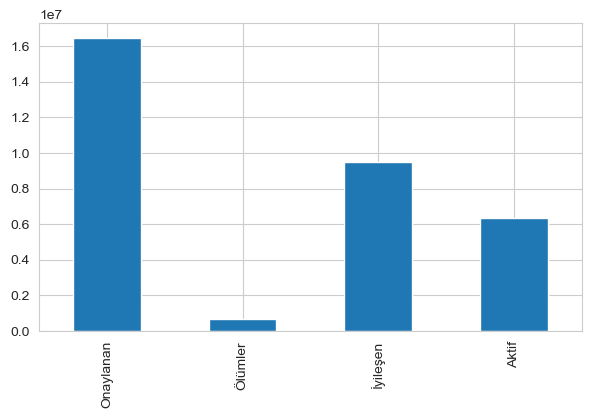

In [18]:
column_names = ['Onaylanan', 'Ölümler', 'İyileşen', 'Aktif']

# Calculate the sum of specified columns
column_sums = data[column_names].sum().plot(kind="bar")

In [19]:
Region = data.groupby(by='Dünya Sağlık Örgütü Bölgesi').sum()
Region

,Ülke,Onaylanan,Ölümler,İyileşen,Aktif,Yeni Vakalar,Yeni Ölümler,Yeni İyileşenler,Ölüm (100 Vaka),İyileşen (100 Vaka),Ölüm (100 İyileşen),Geçen Hafta Onaylanan,Haftalık Değişim,Haftalık Yüzdelik Artış
Dünya Sağlık Örgütü Bölgesi,,,,,,,,,,,,,,
Africa,AlgeriaAngolaBeninBotswanaBurkina FasoBurundiC...,723207,12223,440645,270339,12176,353,14563,111,2737,NaN,608120,115087,868
Americas,Antigua and BarbudaArgentinaBahamasBarbadosBel...,8839286,342732,4468616,4027938,129531,3555,94776,107,2180,NaN,7815198,1024088,572
Eastern Mediterranean,AfghanistanBahrainDjiboutiEgyptIranIraqJordanK...,1490744,38339,1201400,251005,12410,445,14843,78,1465,NaN,1398847,91897,231
Europe,AlbaniaAndorraArmeniaAustriaAzerbaijanBelarusB...,3299523,211144,1993723,1094656,22294,304,11732,235,3844,NaN,3146816,152707,435
South-East Asia,BangladeshBhutanBurmaIndiaIndonesiaMaldivesNep...,1835297,41349,1156933,637015,48993,734,37582,13,667,20,1478283,357014,85
Western Pacific,AustraliaBruneiCambodiaChinaFijiJapanLaosMalay...,292428,8249,206770,77409,3289,24,1127,21,1229,29,266359,26069,354


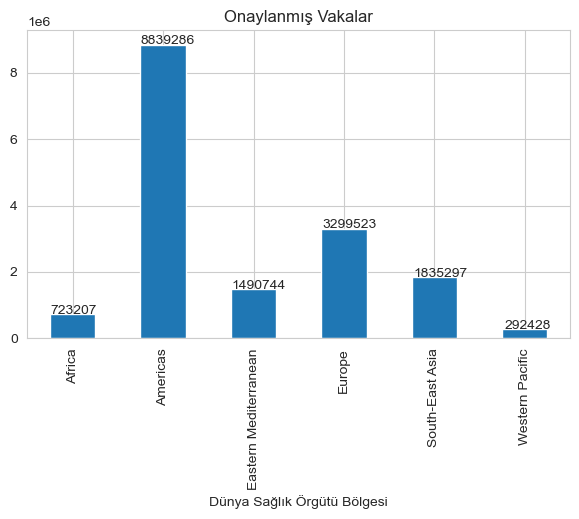

In [20]:
import matplotlib.pyplot as plt

# Çubuk grafiğini çiz
ax = Region['Onaylanan'].plot(kind='bar')

# Grafik üzerine değerleri yazdır
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

# Başlık ekle
plt.title('Onaylanmış Vakalar')

# Grafik göster
plt.show()


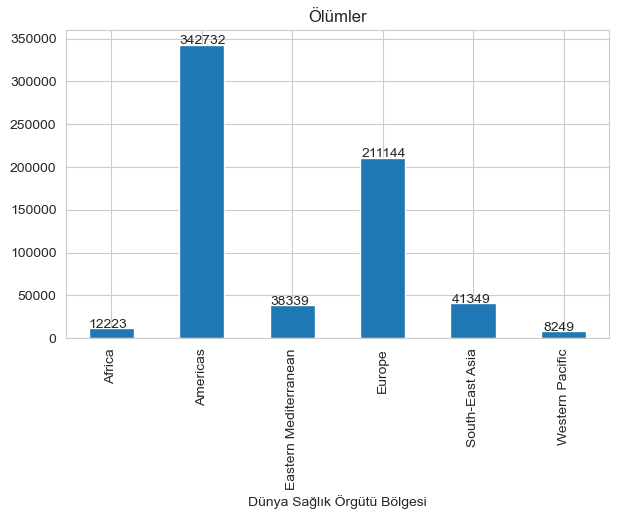

In [21]:
import matplotlib.pyplot as plt

# Çubuk grafiğini çiz
ax = Region['Ölümler'].plot(kind='bar')

# Grafik üzerine değerleri yazdır
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

# Başlık ekle
plt.title('Ölümler')

# Grafik göster
plt.show()


## Ölümler

In [22]:
fig = px.box(data, x="Dünya Sağlık Örgütü Bölgesi", y="Ölümler")

fig.show()

## Onaylanan

In [23]:
fig = px.box(data, x="Dünya Sağlık Örgütü Bölgesi", y="İyileşen")

fig.show()

Text(0.5, 1.0, ' İyileşen')

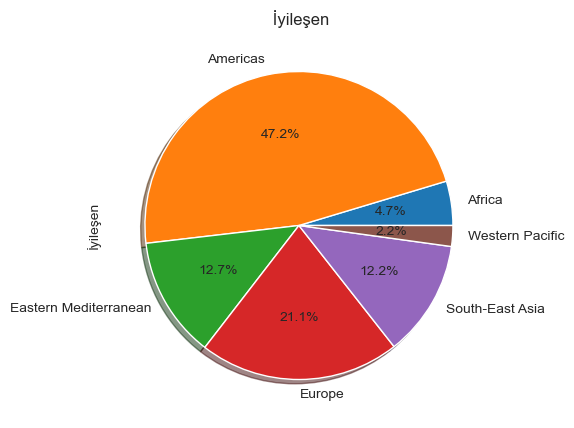

In [24]:
Region['İyileşen'].plot(kind='pie',  figsize=(10,5), shadow=True, autopct='%1.1f%%') 
plt.title(' İyileşen')

Text(0.5, 1.0, ' Aktif')

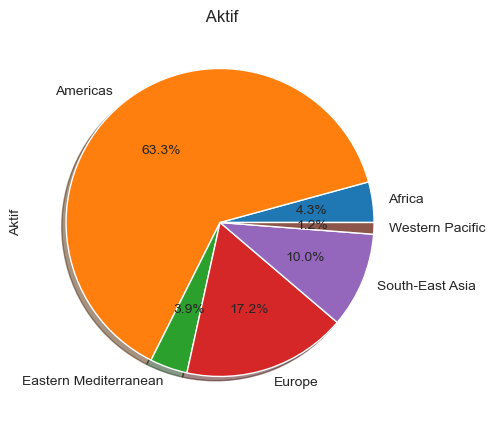

In [25]:
Region['Aktif'].plot(kind='pie', figsize=(10,5), shadow=True, autopct='%1.1f%%') # autopct create % ) 
plt.title(' Aktif')

## Onaylanan Dünya Çapında Vakalar

In [26]:
fig = px.bar(data.sort_values('Onaylanan', ascending=False)[:20][::-1], 
             x='Onaylanan', y='Ülke',
             title='Onaylanan Dünya Çapında Vakalar', text='Onaylanan', height=1000, orientation='h')
fig.show()

In [27]:
# 'date' sütununu tarih tipine dönüştürme
cleaned_data['Tarih'] = pd.to_datetime(cleaned_data['Tarih'])


# Veri çerçevesini 'date' sütununa göre gruplayıp 'confirmed' ve 'deaths' sütunlarını toplayarak özetleme
#grouped = cleaned_data.groupby('date')[['date', 'confirmed', 'deaths']].sum().reset_index()

# Veri çerçevesini 'date' sütununa göre gruplayıp 'confirmed' ve 'deaths' sütunlarını seçip toplamak
grouped = cleaned_data.groupby('Tarih')[['Onaylanmış', 'Ölümler']].sum().reset_index()

# Plotly ile çizimler

fig = px.line(grouped, x="Tarih", y="Onaylanmış", 
              title="Zaman İçinde Dünya Çapında Onaylanmış Vakalar (Logaritmik Ölçek)", 
              log_y=True)
fig.show()

## China || Turkey || US Zaman İçinde Doğrulanan Vakalar

In [28]:
cleaned_data.sample(1)

,Durum,Ülke,Enlem,Boylam,Tarih,Onaylanmış,Ölümler,İyileşenler,Aktif,WHO Bölgesi,Aktif Durum
45695,,Bangladesh,24,90,2020-07-15,193590,2457,105523,85610,South-East Asia,85610


In [29]:
# Çin için veri grubu
grouped_china = cleaned_data[cleaned_data['Ülke'] == "China"].reset_index()
grouped_china_date = grouped_china.groupby('Tarih')[['Onaylanmış', 'Ölümler']].sum().reset_index()

# İtalya için veri grubu
grouped_Turkey = cleaned_data[cleaned_data['Ülke'] == "Turkey"].reset_index()
grouped_Turkey_date = grouped_Turkey.groupby('Tarih')[['Onaylanmış', 'Ölümler']].sum().reset_index()

# ABD için veri grubu
grouped_us = cleaned_data[cleaned_data['Ülke'] == "US"].reset_index()
grouped_us_date = grouped_us.groupby('Tarih')[['Onaylanmış', 'Ölümler']].sum().reset_index()

# Diğer ülkeler için veri grubu
grouped_rest = cleaned_data[~cleaned_data['Ülke'].isin(['China', 'Turkey', 'US'])].reset_index()
grouped_rest_date = grouped_rest.groupby('Tarih')[['Onaylanmış', 'Ölümler']].sum().reset_index()

# Plotly ile çizimler
fig_china = px.line(grouped_china_date, x="Tarih", y="Onaylanmış", title="China: Onaylanmış Cases Over Time")
fig_Turkey = px.line(grouped_Turkey_date, x="Tarih", y="Onaylanmış", title="Turkey: Onaylanmış Cases Over Time")
fig_us = px.line(grouped_us_date, x="Tarih", y="Onaylanmış", title="US: Onaylanmış Cases Over Time")
fig_rest = px.line(grouped_rest_date, x="Tarih", y="Onaylanmış", title="Rest of the World: Onaylanmış Cases Over Time")

# Çizimleri göster
fig_china.show()
fig_Turkey.show()
fig_us.show()
fig_rest.show()


In [30]:
fig_china_bar = px.bar(grouped_china_date, x="Tarih", y="Ölümler", title="China: Ölümler Cases Over Time")
fig_Turkey_bar = px.bar(grouped_Turkey_date, x="Tarih", y="Ölümler", title="Turkey: Ölümler Cases Over Time")
fig_us_bar = px.bar(grouped_us_date, x="Tarih", y="Ölümler", title="US: Ölümler Cases Over Time")
fig_rest_bar = px.bar(grouped_rest_date, x="Tarih", y="Ölümler", title="Rest of the World: Ölümler Cases Over Time")

fig_china_bar.show()
fig_Turkey_bar.show()
fig_us_bar.show()
fig_rest_bar.show()


In [31]:
# Çin için veri grubu
grouped_china = cleaned_data[cleaned_data['Ülke'] == "China"].reset_index()
grouped_china_date = grouped_china.groupby('Tarih')[['Onaylanmış', 'Ölümler']].sum().reset_index()

# İtalya için veri grubu
grouped_Turkey = cleaned_data[cleaned_data['Ülke'] == "Turkey"].reset_index()
grouped_Turkey_date = grouped_Turkey.groupby('Tarih')[['Onaylanmış', 'Ölümler']].sum().reset_index()

# ABD için veri grubu
grouped_us = cleaned_data[cleaned_data['Ülke'] == "US"].reset_index()
grouped_us_date = grouped_us.groupby('Tarih')[['Onaylanmış', 'Ölümler']].sum().reset_index()

# Diğer ülkeler için veri grubu
grouped_rest = cleaned_data[~cleaned_data['Ülke'].isin(['China', 'Turkey', 'US'])].reset_index()
grouped_rest_date = grouped_rest.groupby('Tarih')[['Onaylanmış', 'Ölümler']].sum().reset_index()

In [32]:
cleaned_data.sort_values(by="Ölümler",ascending=False).head()

,Durum,Ülke,Enlem,Boylam,Tarih,Onaylanmış,Ölümler,İyileşenler,Aktif,WHO Bölgesi,Aktif Durum
49030,,US,40,-100,2020-07-27,4290259,148011,1325804,2816444,Americas,2816444
48769,,US,40,-100,2020-07-26,4233923,146935,1297863,2789125,Americas,2789125
48508,,US,40,-100,2020-07-25,4178970,146465,1279414,2753091,Americas,2753091
48247,,US,40,-100,2020-07-24,4112531,145560,1261624,2705347,Americas,2705347
47986,,US,40,-100,2020-07-23,4038816,144430,1233269,2661117,Americas,2661117


In [33]:
data.sample(1)

,Ülke,Onaylanan,Ölümler,İyileşen,Aktif,Yeni Vakalar,Yeni Ölümler,Yeni İyileşenler,Ölüm (100 Vaka),İyileşen (100 Vaka),Ölüm (100 İyileşen),Geçen Hafta Onaylanan,Haftalık Değişim,Haftalık Yüzdelik Artış,Dünya Sağlık Örgütü Bölgesi
120,Netherlands,53413,6160,189,47064,419,1,0,12,0,3259,52132,1281,2,Europe


## Avrupa'da onaylanmış Vakalar

In [34]:
data[data['Dünya Sağlık Örgütü Bölgesi'] == "Europe" ].head(5)

,Ülke,Onaylanan,Ölümler,İyileşen,Aktif,Yeni Vakalar,Yeni Ölümler,Yeni İyileşenler,Ölüm (100 Vaka),İyileşen (100 Vaka),Ölüm (100 İyileşen),Geçen Hafta Onaylanan,Haftalık Değişim,Haftalık Yüzdelik Artış,Dünya Sağlık Örgütü Bölgesi
1,Albania,4880,144,2745,1991,117,6,63,3,56,5,4171,709,17,Europe
3,Andorra,907,52,803,52,10,0,0,6,89,6,884,23,3,Europe
7,Armenia,37390,711,26665,10014,73,6,187,2,71,3,34981,2409,7,Europe
9,Austria,20558,713,18246,1599,86,1,37,3,89,4,19743,815,4,Europe
10,Azerbaijan,30446,423,23242,6781,396,6,558,1,76,2,27890,2556,9,Europe


In [35]:
europe_grouped = data[data['Dünya Sağlık Örgütü Bölgesi'] == "Europe" ]

In [36]:
fig = px.bar(europe_grouped.sort_values('Onaylanan', ascending=False)[:20][::-1], 
             x='Onaylanan', y='Ülke', color_discrete_sequence=['#84DCC6'],
             title='Onaylanan Cases in Europe', text='Onaylanan', orientation='h')
fig.show()

## America'da onaylanmış Vakalar

In [37]:
data[data['Dünya Sağlık Örgütü Bölgesi'] == "Americas" ].head(5)

,Ülke,Onaylanan,Ölümler,İyileşen,Aktif,Yeni Vakalar,Yeni Ölümler,Yeni İyileşenler,Ölüm (100 Vaka),İyileşen (100 Vaka),Ölüm (100 İyileşen),Geçen Hafta Onaylanan,Haftalık Değişim,Haftalık Yüzdelik Artış,Dünya Sağlık Örgütü Bölgesi
5,Antigua and Barbuda,86,3,65,18,4,0,5,3,76,5,76,10,13,Americas
6,Argentina,167416,3059,72575,91782,4890,120,2057,2,43,4,130774,36642,28,Americas
11,Bahamas,382,11,91,280,40,0,0,3,24,12,174,208,120,Americas
14,Barbados,110,7,94,9,0,0,0,6,85,7,106,4,4,Americas
17,Belize,48,2,26,20,0,0,0,4,54,8,40,8,20,Americas


In [38]:
Amerika_grouped = data[data['Dünya Sağlık Örgütü Bölgesi'] == "Americas"]

In [39]:
fig = px.bar(Amerika_grouped.sort_values('Onaylanan', ascending=False)[:20][::-1], 
             x='Onaylanan', y='Ülke', color_discrete_sequence=['#84DCC6'],
             title='Onaylanan Cases in Amerika', text='Onaylanan', orientation='h')
fig.show()

## Africa'da onaylanmış Vakalar

In [40]:
data[data['Dünya Sağlık Örgütü Bölgesi'] == "Africa" ].head(5)

,Ülke,Onaylanan,Ölümler,İyileşen,Aktif,Yeni Vakalar,Yeni Ölümler,Yeni İyileşenler,Ölüm (100 Vaka),İyileşen (100 Vaka),Ölüm (100 İyileşen),Geçen Hafta Onaylanan,Haftalık Değişim,Haftalık Yüzdelik Artış,Dünya Sağlık Örgütü Bölgesi
2,Algeria,27973,1163,18837,7973,616,8,749,4,67,6,23691,4282,18,Africa
4,Angola,950,41,242,667,18,1,0,4,25,17,749,201,27,Africa
18,Benin,1770,35,1036,699,0,0,0,2,59,3,1602,168,10,Africa
22,Botswana,739,2,63,674,53,1,11,0,9,3,522,217,42,Africa
26,Burkina Faso,1100,53,926,121,14,0,6,5,84,6,1065,35,3,Africa


In [41]:
Africa_grouped = data[data['Dünya Sağlık Örgütü Bölgesi'] == "Africa"]


In [42]:
fig = px.bar(Africa_grouped.sort_values('Onaylanan', ascending=False)[:20][::-1], 
             x='Onaylanan', y='Ülke', color_discrete_sequence=['#84DCC6'],
             title='Onaylanan Cases in Africa', text='Onaylanan', orientation='h')
fig.show()

## Eastern Mediterranean'da onaylanmış Vakalar

In [43]:
data[data['Dünya Sağlık Örgütü Bölgesi'] == "Eastern Mediterranean" ].head(5)

,Ülke,Onaylanan,Ölümler,İyileşen,Aktif,Yeni Vakalar,Yeni Ölümler,Yeni İyileşenler,Ölüm (100 Vaka),İyileşen (100 Vaka),Ölüm (100 İyileşen),Geçen Hafta Onaylanan,Haftalık Değişim,Haftalık Yüzdelik Artış,Dünya Sağlık Örgütü Bölgesi
0,Afghanistan,36263,1269,25198,9796,106,10,18,4,69,5,35526,737,2,Eastern Mediterranean
12,Bahrain,39482,141,36110,3231,351,1,421,0,91,0,36936,2546,7,Eastern Mediterranean
48,Djibouti,5059,58,4977,24,9,0,11,1,98,1,5020,39,1,Eastern Mediterranean
52,Egypt,92482,4652,34838,52992,420,46,1007,5,38,13,88402,4080,5,Eastern Mediterranean
81,Iran,293606,15912,255144,22550,2434,212,1931,5,87,6,276202,17404,6,Eastern Mediterranean


In [44]:
Eastern_Mediterranean = data[data['Dünya Sağlık Örgütü Bölgesi'] == "Eastern Mediterranean"]


In [45]:
fig = px.bar(Eastern_Mediterranean.sort_values('Onaylanan', ascending=False)[:20][::-1], 
             x='Onaylanan', y='Ülke', color_discrete_sequence=['#84DCC6'],
             title='Onaylanan Cases in Africa', text='Onaylanan', orientation='h')
fig.show()

## South-East Asia'da onaylanmış Vakalar

In [46]:
data[data['Dünya Sağlık Örgütü Bölgesi'] == "South-East Asia" ].head(5)

,Ülke,Onaylanan,Ölümler,İyileşen,Aktif,Yeni Vakalar,Yeni Ölümler,Yeni İyileşenler,Ölüm (100 Vaka),İyileşen (100 Vaka),Ölüm (100 İyileşen),Geçen Hafta Onaylanan,Haftalık Değişim,Haftalık Yüzdelik Artış,Dünya Sağlık Örgütü Bölgesi
13,Bangladesh,226225,2965,125683,97577,2772,37,1801,1,56,2,207453,18772,9,South-East Asia
19,Bhutan,99,0,86,13,4,0,1,0,87,0,90,9,10,South-East Asia
27,Burma,350,6,292,52,0,0,2,2,83,2,341,9,3,South-East Asia
79,India,1480073,33408,951166,495499,44457,637,33598,2,64,4,1155338,324735,28,South-East Asia
80,Indonesia,100303,4838,58173,37292,1525,57,1518,5,58,8,88214,12089,14,South-East Asia


In [47]:
South_East_Asia = data[data['Dünya Sağlık Örgütü Bölgesi'] == "South-East Asia"]

In [48]:
fig = px.bar(South_East_Asia.sort_values('Onaylanan', ascending=False)[:20][::-1], 
             x='Onaylanan', y='Ülke', color_discrete_sequence=['#84DCC6'],
             title='Onaylanan Cases in Africa', text='Onaylanan', orientation='h')
fig.show()

# Zaman İçinde Onaylanmış Ölümler

## Doğrulanmış Vakaların Bulunduğu Avrupa Ülkeleri

In [49]:
fig = px.choropleth(data, 
                    locations="Ülke", 
                    locationmode='country names',  # Konum modunu ülke adları olarak ayarlayın
                    color="Ölümler", 
                    hover_name="Ülke",  # Fareyi yerin üzerine getirdiğinizde gösterilecek metni ülke adları olarak ayarlayın
                    range_color=[1,100], 
                    color_continuous_scale="peach", 
                    title='Rapor Edilen Ölümlere Sahip Ülkeler')
fig.show()


## Doğrulanmış Vakaların Bulunduğu Avrupa Ülkeleri

In [50]:
fig = px.choropleth(data, 
                    locations="Ülke", 
                    locationmode='country names', 
                    color="Onaylanan", 
                    hover_name="Ülke", 
                    range_color=[1,20000], 
                    color_continuous_scale='portland', 
                    title='Doğrulanmış Vakaların Bulunduğu Avrupa Ülkeleri', 
                    scope='europe', 
                    height=800)
fig.show()


In [51]:
data.sample(1)

,Ülke,Onaylanan,Ölümler,İyileşen,Aktif,Yeni Vakalar,Yeni Ölümler,Yeni İyileşenler,Ölüm (100 Vaka),İyileşen (100 Vaka),Ölüm (100 İyileşen),Geçen Hafta Onaylanan,Haftalık Değişim,Haftalık Yüzdelik Artış,Dünya Sağlık Örgütü Bölgesi
93,Kyrgyzstan,33296,1301,21205,10790,483,24,817,4,64,6,27143,6153,23,Europe


In [52]:
cleaned_data.sample(1)

,Durum,Ülke,Enlem,Boylam,Tarih,Onaylanmış,Ölümler,İyileşenler,Aktif,WHO Bölgesi,Aktif Durum
6359,,Ecuador,-2,-78,2020-02-15,0,0,0,0,Americas,0


## Confirmed Deaths Over Time

In [53]:
fig = px.line(grouped, x="Tarih", y="Ölümler", 
              title="Zaman İçinde Dünya Çapında Onaylanmış Vakalar (Logaritmik Ölçek)", 
              log_y=True)
fig.show()

In [54]:
# Plotly ile çizimler
fig_china = px.line(grouped_china_date, x="Tarih", y="Ölümler", title="China: Ölümler Cases Over Time")
fig_Turkey = px.line(grouped_Turkey_date, x="Tarih", y="Ölümler", title="Turkey: Ölümler Cases Over Time")
fig_us = px.line(grouped_us_date, x="Tarih", y="Ölümler", title="US: Ölümler Cases Over Time")
fig_rest = px.line(grouped_rest_date, x="Tarih", y="Ölümler", title="Rest of the World: Ölümler Cases Over Time")

# Çizimleri göster
fig_china.show()
fig_Turkey.show()
fig_us.show()
fig_rest.show()

## En Çok Ölenler: İlk 10 Ülke

In [55]:
# Her ülkenin maksimum ölüm sayısını alarak veriyi gruplayın
max_deaths_per_country = cleaned_data.groupby('Ülke')['Ölümler'].max().reset_index()

# Ölüm sayısına göre sıralayın ve ilk 10 ülkeyi seçin
top_countries = max_deaths_per_country.sort_values('Ölümler', ascending=False)[:10][::-1]

# Grafik oluşturun
fig = px.bar(top_countries, x='Ölümler', y='Ülke', color_discrete_sequence=['#84DCC6'],
             title='En Çok Ölenler: İlk 10 Ülke', text='Ölümler', orientation='h')
fig.show()


## Avrupa'da Ölmüş Vakalar

In [56]:
fig = px.bar(europe_grouped.sort_values('Ölümler', ascending=False)[:20][::-1], 
             x='Onaylanan', y='Ülke', color_discrete_sequence=['#84DCC6'],
             title='Onaylanan Cases in Europe', text='Onaylanan', orientation='h')
fig.show()

## Amerika'da Ölmüş Vakalar

In [57]:
fig = px.bar(Amerika_grouped.sort_values('Ölümler', ascending=False)[:20][::-1], 
             x='Ölümler', y='Ülke', color_discrete_sequence=['#84DCC6'],
             title='Ölümler Cases in Amerika', text='Ölümler', orientation='h')
fig.show()

## Eastern Mediterranean'da Ölmüş Vakalar

In [58]:
fig = px.bar(South_East_Asia.sort_values('Ölümler', ascending=False)[:20][::-1], 
             x='Ölümler', y='Ülke', color_discrete_sequence=['#84DCC6'],
             title='Ölümler Cases in Amerika', text='Ölümler', orientation='h')
fig.show()

## Africa'da Ölmüş Vakalar

In [59]:
fig = px.bar(Africa_grouped.sort_values('Ölümler', ascending=False)[:20][::-1], 
             x='Ölümler', y='Ülke', color_discrete_sequence=['#84DCC6'],
             title='Ölümler Cases in Amerika', text='Ölümler', orientation='h')
fig.show()

In [60]:
temp = cleaned_data.groupby('Tarih')[['İyileşenler', 'Ölümler', 'Aktif']].sum().reset_index()
temp = temp.melt(id_vars="Tarih", value_vars=['İyileşenler', 'Ölümler', 'Aktif'],
                 var_name='case', value_name='count')

fig = px.line(temp, x="Tarih", y="count", color='case',
             title='Zaman İçindeki Vakalar: Çizgi Grafiği', color_discrete_sequence=['cyan', 'red', 'orange'])
fig.show()

fig = px.area(temp, x="Tarih", y="count", color='case',
             title='Zaman İçindeki Vakalar: Alan Grafiği', color_discrete_sequence=['cyan', 'red', 'orange'])
fig.show()


## Onaylanmış 100 Vaka Başına Ölümler

In [61]:
cleaned_latest = cleaned_data[cleaned_data['Tarih'] == max(cleaned_data['Tarih'])]
flg = cleaned_latest.groupby('Ülke')[['Onaylanmış', 'Ölümler', 'İyileşenler', 'Aktif']].sum().reset_index()

flg['mortalityRate'] = round((flg['Ölümler'] / flg['Onaylanmış']) * 100, 2)
temp = flg[flg['Onaylanmış'] > 100]
temp = temp.sort_values('mortalityRate', ascending=False)

fig = px.bar(temp.sort_values(by="mortalityRate", ascending=False)[:10][::-1],
             x='mortalityRate', y='Ülke', 
             title='Ölümler per 100 Onaylanmış Cases', text='mortalityRate', height=800, orientation='h',
             color_discrete_sequence=['darkred']
            )
fig.show()


## Worldwide Analysis

### COVID-19: Zamana Yayılım

In [62]:
formated_gdf = cleaned_data.groupby(['Tarih', 'Ülke'])[['Onaylanmış', 'Ölümler']].max()
formated_gdf = formated_gdf.reset_index()
formated_gdf['Tarih'] = pd.to_datetime(formated_gdf['Tarih'])  # "Tarih" sütununu datetime formatına dönüştür
formated_gdf['Tarih'] = formated_gdf['Tarih'].dt.strftime('%m/%d/%Y')  # "Tarih" sütununu belirli bir biçime dönüştür
formated_gdf['size'] = formated_gdf['Onaylanmış'].pow(0.3)

fig = px.scatter_geo(formated_gdf, locations="Ülke", locationmode='country names', 
                     color="Onaylanmış", size='size', hover_name="Ülke", 
                     range_color=[0, 1500], 
                     projection="natural earth", animation_frame="Tarih", 
                     title='COVID-19: Spread Over Time', color_continuous_scale="portland")
# fig.update_layout(coloraxis_showscale=False)
fig.show()


# Xray_Covid-19 CNN

### Getting the Data

In [63]:
import os
import pandas as pd
import tensorflow as tf
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.image import imread

In [64]:
pwd

'C:\\Users\\tr_co\\OneDrive\\Masaüstü\\Covit_data'

In [65]:
my_data_dir='C:\\Users\\tr_co\\OneDrive\\Masaüstü\\Covit_data\\COVID_19'

In [66]:
os.listdir(my_data_dir)

['covid', 'normal', 'virus']

## Train Test Split¶

In [67]:
import os
import shutil
import random

train_dir = "C:\\Users\\tr_co\\OneDrive\\Masaüstü\\Covit_data\\COVID_19"
test_dir = "C:\\Users\\tr_co\\OneDrive\\Masaüstü\\Covit_data\\xray_dataset_covid19\\test"

In [68]:
os.listdir(train_dir)

['covid', 'normal', 'virus']

In [69]:
import os

# Veri klasörü yolu
my_data_dir='C:\\Users\\tr_co\\OneDrive\\Masaüstü\\Covit_data\\COVID_19'


# Bitki türleri
covid_19_types = ["covid", "normal", "virus"]

# Her bir bitki türü için boş liste oluştur
virus = []
normal = []
covid = []

# Her bir bitki türü için dosya sayısını hesaplayın ve dosya isimlerini ilgili listeye ekleyin
for plant_type in covid_19_types:
    # Bitki türü klasöründeki dosya sayısını alın
    file_list = os.listdir(os.path.join(my_data_dir, plant_type))
    
    # Her bir dosyayı ilgili listeye ekleyin
    if plant_type == "virus":
        virus.extend(file_list)
    elif plant_type == "normal":
        normal.extend(file_list)
    elif plant_type == "covid":
        covid.extend(file_list)
    
    # Dosya sayısını yazdırın
    print(f"Number of {plant_type} images:", len(file_list))

# Her bitki türü için listenin uzunluğunu hesaplayın
total_length = 0
for covid_19_types in [virus, normal, covid]:
    total_length += len(covid_19_types)

# Toplam sayıyı bulun
total_plants = len(covid_19_types)

# Her bir grup için ortalama uzunluğu hesaplayın
virus_average = len(virus) / total_plants
normal_average = len(normal) / total_plants
covid_average = len(covid) / total_plants

print("------------------------:")

# Her bir grup için ortalama uzunluğu yazdırın
print("virus average:", virus_average)
print("normal average:", normal_average)
print("covid average:", covid_average)



Number of covid images: 536
Number of normal images: 668
Number of virus images: 619
------------------------:
virus average: 1.1548507462686568
normal average: 1.2462686567164178
covid average: 1.0


## test shape

In [70]:
test_dir

'C:\\Users\\tr_co\\OneDrive\\Masaüstü\\Covit_data\\xray_dataset_covid19\\test'

In [71]:
os.listdir(test_dir)

['covid', 'normal', 'virus']

In [72]:
import os
from skimage.io import imread

test_dir = 'C:\\Users\\tr_co\\OneDrive\\Masaüstü\\Covit_data\\xray_dataset_covid19\\test'
x = []
y = []

for category in os.listdir(test_dir):
    category_path = os.path.join(test_dir, category)
    for image in os.listdir(category_path):
        img = imread(os.path.join(category_path, image))
        d1, d2 = img.shape[:2]  # Tek boyutlu olabilir
        x.append(d1)
        y.append(d2)


<Axes: >

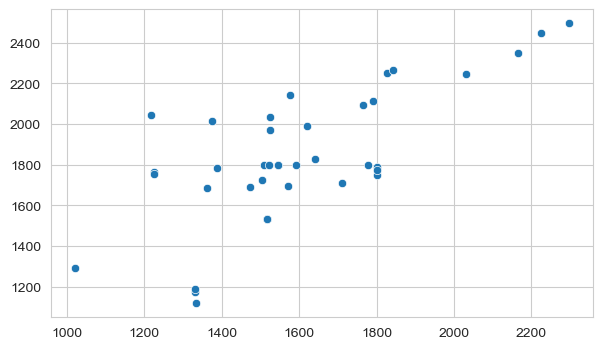

In [73]:
sns.scatterplot(x=x,y=y)


In [74]:
np.mean(x)

1596.5

In [75]:
np.mean(y)


1827.725

## train shape

In [76]:
train_dir

'C:\\Users\\tr_co\\OneDrive\\Masaüstü\\Covit_data\\COVID_19'

In [77]:
import os
from skimage.io import imread

train_dir = 'C:\\Users\\tr_co\\OneDrive\\Masaüstü\\Covit_data\\COVID_19\\'
x = []
y = []

for category in os.listdir(train_dir):
    category_path = os.path.join(train_dir, category)
    for image in os.listdir(category_path):
        img = imread(os.path.join(category_path, image))
        d1, d2 = img.shape[:2]  # Tek boyutlu olabilir
        x.append(d1)
        y.append(d2)


<Axes: >

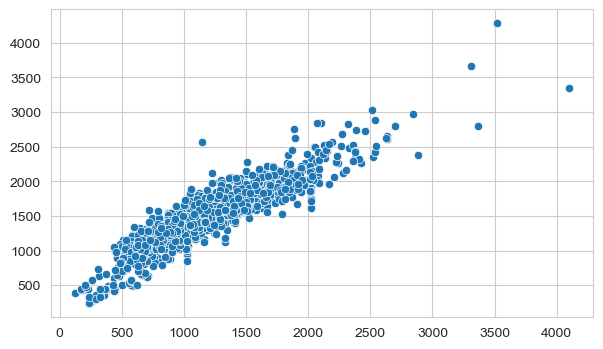

In [78]:
sns.scatterplot(x=x,y=y)

In [79]:
np.mean(x)

1100.9983543609435

In [80]:
np.mean(y)

1384.256719692814

In [81]:
image_shape = (1100,1384,3)

In [82]:
os.listdir(train_dir + '\\virus')[17]

'person111_virus_209.jpeg'

In [83]:
covid_cell = train_dir+'\\virus'+'\person115_virus_219.jpeg'

In [84]:
imread(covid_cell)     

array([[30, 30, 32, ...,  7,  4,  6],
       [29, 31, 33, ...,  0,  0,  7],
       [30, 31, 34, ...,  4, 12,  0],
       ...,
       [ 0, 10, 18, ...,  0,  0,  0],
       [ 4,  0,  1, ...,  0,  0,  0],
       [ 3,  0, 16, ...,  0,  0,  0]], dtype=uint8)

In [85]:
train_dir

'C:\\Users\\tr_co\\OneDrive\\Masaüstü\\Covit_data\\COVID_19\\'

In [86]:
covid_img= imread(covid_cell)

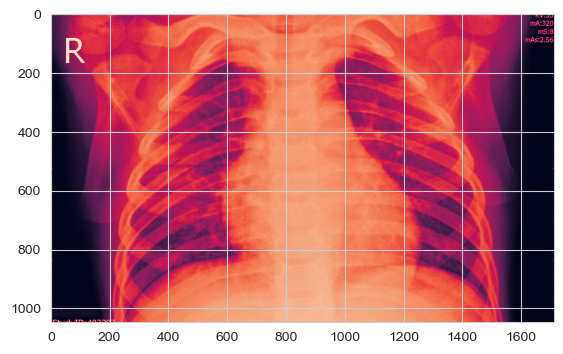

In [87]:
plt.imshow(covid_img)


In [88]:
covid_img.shape

(1048, 1712)

## Preparing the Data for the model

In [89]:
covid_img.max()

255

Yukarı da normalde min=0 ve max=255 çıkmasını beklerken daha önceden scale işlemi yapılmamış olduğunu görüyoruz 


In [90]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2

In [91]:
#pip install opencv-python

In [92]:
image_gen = ImageDataGenerator(rotation_range=15, 
                               width_shift_range=0.10, 
                               height_shift_range=0.10, 
                               shear_range=0.1, 
                               zoom_range=0.1, 
                               horizontal_flip=True, 
                               fill_mode='nearest')
covid_img_rgb = cv2.cvtColor(covid_img, cv2.COLOR_GRAY2RGB)


In [93]:
covid_img.shape

(1048, 1712)

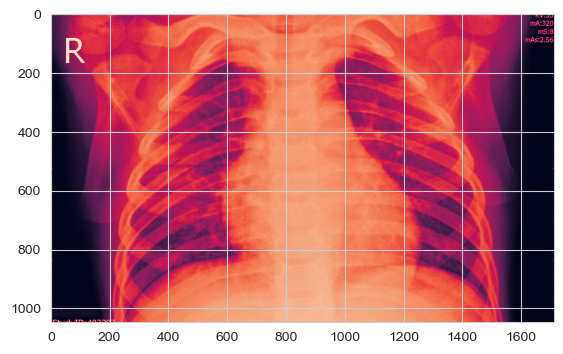

In [94]:
plt.imshow(covid_img)

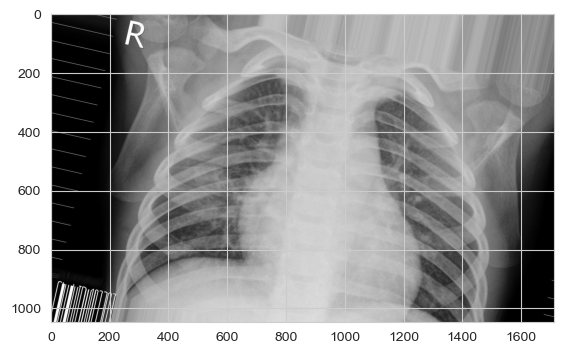

In [95]:
plt.imshow(image_gen.random_transform(covid_img_rgb))

In [96]:
image_gen.flow_from_directory(train_dir)

Found 1708 images belonging to 3 classes.


# Creating the Model


In [97]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.applications.resnet import ResNet152, preprocess_input, decode_predictions
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, SeparableConv2D, BatchNormalization, Flatten, Dense, Dropout, Input
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

In [98]:
# Model oluştur
model = Sequential()

# İlk conv blok
model.add(Conv2D(filters=4, kernel_size=(3, 3), activation='relu', padding='same',input_shape = (1100, 1384, 3)
 ))
model.add(Conv2D(filters=4, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# İkinci conv blok
model.add(Conv2D(filters=8, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(Conv2D(filters=8, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Üçüncü conv blok
model.add(Conv2D(filters=16, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(Conv2D(filters=16, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# İlk separable conv blok
model.add(SeparableConv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

# İkinci separable conv blok
model.add(SeparableConv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

# Üçüncü separable conv blok
model.add(SeparableConv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.2))

# Dördüncü separable conv blok
model.add(SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.2))

# Beşinci separable conv blok
# Beşinci separable conv blok
model.add(SeparableConv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
# model.add(MaxPooling2D(pool_size=(2, 2)))  # Bu satırı kaldırın
model.add(Dropout(rate=0.2))


# Tam bağlantılı (Fully Connected) katmanlar
model.add(Flatten())
model.add(Dense(units=512, activation='relu'))
model.add(Dropout(rate=0.7))
model.add(Dense(units=128, activation='relu'))
model.add(Dropout(rate=0.5))
model.add(Dense(units=64, activation='relu'))
model.add(Dropout(rate=0.3))
model.add(Dense(units=32, activation='relu'))
model.add(Dropout(rate=0.3))

# Çıkış katmanı
model.add(Dense(units=3, activation='softmax'))

# Model derleme
opt = "adam"
model.compile(loss="sparse_categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

# Model özeti
model.summary()

# Model eğitimi
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 1100, 1384, 4)  │           112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 1100, 1384, 4)  │           148 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 550, 692, 4)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 550, 692, 8)    │           296 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 550, 692, 8)    │           584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 275, 346, 8)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 275, 346, 16)   │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 275, 346, 16)   │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 137, 173, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d                │ (None, 137, 173, 32)   │           688 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_1              │ (None, 137, 173, 32)   │         1,344 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 137, 173, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 68, 86, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_2              │ (None, 68, 86, 64)     │         2,400 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_3              │ (None, 68, 86, 64)     │         4,736 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 68, 86, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 34, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_4              │ (None, 34, 43, 128)    │         8,896 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_5              │ (None, 34, 43, 128)    │        17,664 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 34, 43, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 21,595,879 (82.38 MB)

 Trainable params: 21,593,895 (82.37 MB)

 Non-trainable params: 1,984 (7.75 KB)

## Early Stopping

In [99]:
from tensorflow.keras.callbacks import EarlyStopping

In [127]:
early_stop = EarlyStopping(monitor='val_loss',patience=5)

In [101]:
batch_size = 32
train_image_gen = image_gen.flow_from_directory(train_dir,
                                               target_size=(1100, 1384),
                                               color_mode='rgb',
                                               batch_size=batch_size,
                                               class_mode='categorical', shuffle=True)

Found 1708 images belonging to 3 classes.


In [102]:
train_image_gen.class_indices

{'covid': 0, 'normal': 1, 'virus': 2}

In [103]:
os.listdir(test_dir)

['covid', 'normal', 'virus']

In [104]:
image_gen.flow_from_directory(test_dir)

Found 40 images belonging to 3 classes.


In [105]:
test_image_gen = image_gen.flow_from_directory(test_dir,
                                               target_size=(1100, 1384),
                                               color_mode='rgb',
                                               batch_size=batch_size,
                                               class_mode='categorical', shuffle=True)

Found 40 images belonging to 3 classes.


In [106]:
#results = model.fit(train_image_gen,epochs=30,
#                    validation_data=test_image_gen,
#                   callbacks=[early_stop])

#early_stop kullandığımız da model erken bitiyor öğrenmesini engel oluyor muyuz ??kullanmalımıyız

model overfitting

# aynı model early stop yok

In [107]:
results = model.fit(train_image_gen,epochs=20,
                    validation_data=test_image_gen)

Epoch 1/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 747s 12s/step - accuracy: 0.4064 - loss: 1.0482 - val_accuracy: 0.2500 - val_loss: 1.1205
Epoch 2/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 714s 12s/step - accuracy: 0.7181 - loss: 0.7066 - val_accuracy: 0.5000 - val_loss: 1.0752
Epoch 3/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 686s 11s/step - accuracy: 0.8163 - loss: 0.5135 - val_accuracy: 0.2500 - val_loss: 1.2020
Epoch 4/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 700s 11s/step - accuracy: 0.8300 - loss: 0.5920 - val_accuracy: 0.5000 - val_loss: 1.0529
Epoch 5/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 704s 12s/step - accuracy: 0.8654 - loss: 0.5146 - val_accuracy: 0.2500 - val_loss: 1.3534
Epoch 6/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 700s 11s/step - accuracy: 0.8742 - loss: 0.4716 - val_accuracy: 0.2500 - val_loss: 1.6447
Epoch 7/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 698s 11s/step - accuracy: 0.8718 - loss: 0.4678 - val_accuracy: 0.5000 - val_loss: 1.0569
Epoch 8/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 692s 11s/step - accuracy: 0.8781 - loss: 0.3804 - val_accuracy: 0.

# model 2


In [108]:
# Model oluştur
model = Sequential()

# İlk conv blok
model.add(Conv2D(filters=4, kernel_size=(3, 3), activation='relu', padding='same',input_shape = (1100, 1384, 3)
 ))
model.add(Conv2D(filters=4, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# İkinci conv blok
model.add(Conv2D(filters=8, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(Conv2D(filters=8, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Üçüncü conv blok
model.add(Conv2D(filters=16, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(Conv2D(filters=16, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# İlk separable conv blok
model.add(SeparableConv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

# İkinci separable conv blok
model.add(SeparableConv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

# Üçüncü separable conv blok
model.add(SeparableConv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.2))

model.add(BatchNormalization())
# model.add(MaxPooling2D(pool_size=(2, 2)))  # Bu satırı kaldırın
model.add(Dropout(rate=0.2))


# Tam bağlantılı (Fully Connected) katmanlar
model.add(Flatten())
model.add(Dense(units=512, activation='relu'))
model.add(Dropout(rate=0.7))
model.add(Dense(units=128, activation='relu'))
model.add(Dropout(rate=0.5))
model.add(Dense(units=64, activation='relu'))
model.add(Dropout(rate=0.3))


# Çıkış katmanı
model.add(Dense(units=3, activation='softmax'))

# Model derleme
opt = "adam"
model.compile(loss="sparse_categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

# Model özeti
model.summary()

# Model eğitimi
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 1100, 1384, 4)  │           112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 1100, 1384, 4)  │           148 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 550, 692, 4)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 550, 692, 8)    │           296 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 550, 692, 8)    │           584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 275, 346, 8)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 275, 346, 16)   │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 275, 346, 16)   │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 137, 173, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_10             │ (None, 137, 173, 32)   │           688 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_11             │ (None, 137, 173, 32)   │         1,344 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 137, 173, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 68, 86, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_12             │ (None, 68, 86, 64)     │         2,400 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_13             │ (None, 68, 86, 64)     │         4,736 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 68, 86, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 34, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_14             │ (None, 34, 43, 128)    │         8,896 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 34, 43, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 17, 21, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 17, 21, 128)    │             

 Total params: 23,495,079 (89.63 MB)

 Trainable params: 23,494,375 (89.62 MB)

 Non-trainable params: 704 (2.75 KB)

In [109]:
batch_size = 256
results = model.fit(train_image_gen,epochs=50,
                    validation_data=test_image_gen,
                   callbacks=[early_stop])

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 738s 12s/step - accuracy: 0.5903 - loss: 3.8423 - val_accuracy: 0.5000 - val_loss: 1.0766
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 743s 12s/step - accuracy: 0.7060 - loss: 2.6541 - val_accuracy: 0.5000 - val_loss: 1.0514
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 707s 11s/step - accuracy: 0.7184 - loss: 1.9109 - val_accuracy: 0.2500 - val_loss: 1.2704
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 710s 12s/step - accuracy: 0.7538 - loss: 1.3200 - val_accuracy: 0.5000 - val_loss: 1.0901
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 698s 11s/step - accuracy: 0.7965 - loss: 1.3187 - val_accuracy: 0.2500 - val_loss: 1.2891
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 698s 12s/step - accuracy: 0.8044 - loss: 0.8139 - val_accuracy: 0.2500 - val_loss: 1.8310
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 699s 11s/step - accuracy: 0.8088 - loss: 0.8329 - val_accuracy: 0.2500 - val_loss: 1.3503


In [110]:
# Model oluştur
model = Sequential()

# İlk conv blok
model.add(Conv2D(filters=4, kernel_size=(3, 3), activation='relu', padding='same',input_shape = (1100, 1384, 3)
 ))
model.add(Conv2D(filters=4, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# İkinci conv blok
model.add(Conv2D(filters=8, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(Conv2D(filters=8, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Üçüncü conv blok
model.add(Conv2D(filters=16, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(Conv2D(filters=16, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# İlk separable conv blok
model.add(SeparableConv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

# İkinci separable conv blok
model.add(SeparableConv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

# Üçüncü separable conv blok
model.add(SeparableConv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.2))

# Dördüncü separable conv blok
model.add(SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.2))

# Beşinci separable conv blok
# Beşinci separable conv blok
model.add(SeparableConv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
# model.add(MaxPooling2D(pool_size=(2, 2)))  # Bu satırı kaldırın
model.add(Dropout(rate=0.2))


# Tam bağlantılı (Fully Connected) katmanlar
model.add(Flatten())
model.add(Dense(units=512, activation='relu'))
model.add(Dropout(rate=0.7))
model.add(Dense(units=128, activation='relu'))
model.add(Dropout(rate=0.5))
model.add(Dense(units=64, activation='relu'))
model.add(Dropout(rate=0.3))
model.add(Dense(units=32, activation='relu'))
model.add(Dropout(rate=0.3))

# Çıkış katmanı
model.add(Dense(units=3, activation='softmax'))

# Model derleme
opt = "adam"
model.compile(loss="sparse_categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

# Model özeti
model.summary()

# Model eğitimi
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])



Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 1100, 1384, 4)  │           112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 1100, 1384, 4)  │           148 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 550, 692, 4)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 550, 692, 8)    │           296 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 550, 692, 8)    │           584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 275, 346, 8)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 275, 346, 16)   │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 275, 346, 16)   │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 137, 173, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_15             │ (None, 137, 173, 32)   │           688 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_16             │ (None, 137, 173, 32)   │         1,344 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 137, 173, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 68, 86, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_17             │ (None, 68, 86, 64)     │         2,400 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_18             │ (None, 68, 86, 64)     │         4,736 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 68, 86, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 34, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_19             │ (None, 34, 43, 128)    │         8,896 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_20             │ (None, 34, 43, 128)    │        17,664 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 34, 43, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 21,595,879 (82.38 MB)

 Trainable params: 21,593,895 (82.37 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [111]:
batch_size = 128
results = model.fit(train_image_gen,epochs=50,
                    validation_data=test_image_gen,
                   callbacks=[early_stop])

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 765s 12s/step - accuracy: 0.5116 - loss: 0.9417 - val_accuracy: 0.2500 - val_loss: 1.1599
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 738s 12s/step - accuracy: 0.7610 - loss: 0.6370 - val_accuracy: 0.2500 - val_loss: 1.2249
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 733s 12s/step - accuracy: 0.8289 - loss: 0.5326 - val_accuracy: 0.2500 - val_loss: 1.1034
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 716s 12s/step - accuracy: 0.8413 - loss: 0.5628 - val_accuracy: 0.2500 - val_loss: 1.0881
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 729s 12s/step - accuracy: 0.8699 - loss: 0.4546 - val_accuracy: 0.2500 - val_loss: 1.1285


In [125]:
# Define your model architecture
model = Sequential()
model.add(Conv2D(filters=4, kernel_size=(3, 3), activation='relu', padding='same', input_shape=(1100, 1384, 3)))
model.add(Dense(128, activation="relu"))
model.add(BatchNormalization()) 

model.add(Dense(128, activation="relu"))
model.add(BatchNormalization())  
model.add(Dropout(0.2))

model.add(Dense(64, activation="relu"))
model.add(BatchNormalization())  
model.add(Dropout(0.2))

model.add(Dense(32, activation="relu"))
model.add(BatchNormalization()) 

model.add(Dense(units=3, activation="softmax"))

# Compile the model with Adam optimizer
opt = Adam(learning_rate=0.001)
model.compile(optimizer=opt, 
              loss="categorical_crossentropy",
              metrics=["accuracy"])


In [ ]:
# Model oluştur
model = Sequential()

# İlk conv blok
model.add(Conv2D(filters=4, kernel_size=(3, 3), activation='relu', padding='same',input_shape = (1100, 1384, 3)
 ))
model.add(Conv2D(filters=4, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# İkinci conv blok
model.add(Conv2D(filters=8, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(Conv2D(filters=8, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Üçüncü conv blok
model.add(Conv2D(filters=16, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(Conv2D(filters=16, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# İlk separable conv blok
model.add(SeparableConv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

# İkinci separable conv blok
model.add(SeparableConv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

# Üçüncü separable conv blok
model.add(SeparableConv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.2))

# Dördüncü separable conv blok
model.add(SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.2))

# Beşinci separable conv blok
# Beşinci separable conv blok
model.add(SeparableConv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(SeparableConv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
# model.add(MaxPooling2D(pool_size=(2, 2)))  # Bu satırı kaldırın
model.add(Dropout(rate=0.2))


# Tam bağlantılı (Fully Connected) katmanlar
model.add(Flatten())
model.add(Dense(units=512, activation='relu'))
model.add(Dropout(rate=0.7))
model.add(Dense(units=128, activation='relu'))
model.add(Dropout(rate=0.5))
model.add(Dense(units=64, activation='relu'))
model.add(Dropout(rate=0.3))
model.add(Dense(units=32, activation='relu'))
model.add(Dropout(rate=0.3))

# Çıkış katmanı
model.add(Dense(units=3, activation='softmax'))

# Model derleme
opt = "adam"
model.compile(loss="sparse_categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

# Model eğitimi
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])



In [128]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Model oluşturma
model = Sequential()

# 1. CNN katmanı
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(1100, 1384, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))

# 2. CNN katmanı
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# 3. CNN katmanı
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# 4. CNN katmanı
model.add(Conv2D(256, (3, 3), activation='relu'))
model.add(Conv2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten katmanı
model.add(Flatten())

# Tam bağlantılı (Fully Connected) katman
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))

# Çıkış katmanı
model.add(Dense(3, activation='softmax'))  

# Model derleme
model.compile(loss='categorical_crossentropy',  
              optimizer='adam',  
              metrics=['accuracy'])  

# Model özeti
model.summary()


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_22 (Conv2D)              │ (None, 1098, 1382, 32) │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 549, 691, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 547, 689, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 545, 687, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 272, 343, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 270, 341, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 268, 339, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 134, 169, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_27 (Conv2D)              │ (None, 132, 167, 256)  │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ (None, 130, 165, 256)  │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 65, 82, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 1364480)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 512)            │   698,614,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 3)              │         1,539 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 699,778,819 (2.61 GB)

 Trainable params: 699,778,819 (2.61 GB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
batch_size = 512
results = model.fit(train_image_gen,epochs=100,
                    validation_data=test_image_gen,
                   callbacks=[early_stop])


Epoch 1/100
